In [2]:
## Import necessary packages
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

# Set pandas's max row display
pd.set_option('display.max_row', 1000)

# Set pandas's max column width to 50
pd.set_option('display.max_columns', 50)

In [3]:
pip install folium 


Note: you may need to restart the kernel to use updated packages.


In [4]:
import folium
from folium import plugins
from folium.plugins import MarkerCluster

In [5]:
# Load in the Chicago crime dataset
df = pd.read_csv('Crimes_-_2001_to_Present.csv')

In [6]:
## Print first 5 lines of dataset
df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,5741943,HN549294,08/25/2007 09:22:18 AM,074XX N ROGERS AVE,0560,ASSAULT,SIMPLE,OTHER,False,False,2422,24.0,49.0,1.0,08A,NaN,NaN,2007,08/17/2015 03:03:40 PM,NaN,NaN,NaN
1,25953,JE240540,05/24/2021 03:06:00 PM,020XX N LARAMIE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,True,False,2515,25.0,36.0,19.0,01A,1141387.0,1913179.0,2021,11/18/2023 03:39:49 PM,41.917838,-87.755969,"(41.917838056, -87.755968972)"
2,26038,JE279849,06/26/2021 09:24:00 AM,062XX N MC CORMICK RD,0110,HOMICIDE,FIRST DEGREE MURDER,PARKING LOT,True,False,1711,17.0,50.0,13.0,01A,1152781.0,1941458.0,2021,11/18/2023 03:39:49 PM,41.995219,-87.713355,"(41.995219444, -87.713354912)"
3,13279676,JG507211,11/09/2023 07:30:00 AM,019XX W BYRON ST,0620,BURGLARY,UNLAWFUL ENTRY,APARTMENT,False,False,1922,19.0,47.0,5.0,05,1162518.0,1925906.0,2023,11/18/2023 03:39:49 PM,41.952345,-87.677975,"(41.952345086, -87.677975059)"
4,13274752,JG501049,11/12/2023 07:59:00 AM,086XX S COTTAGE GROVE AVE,0454,BATTERY,"AGGRAVATED P.O. - HANDS, FISTS, FEET, NO / MIN...",SMALL RETAIL STORE,False,False,632,6.0,6.0,44.0,08B,1183071.0,1847869.0,2023,11/25/2023 03:41:03 PM,41.737751,-87.604856,"(41.737750767, -87.604855911)"


In [7]:
## Print first 5 lines of dataset
df.tail()


,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
7943338,13047495,JG229914,04/18/2023 08:00:00 AM,003XX N JEFFERSON ST,1154,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT $300 AND UNDER,APARTMENT,False,False,1214,12.0,42.0,28.0,11,1172269.0,1902384.0,2023,08/19/2023 03:40:26 PM,41.887589,-87.642827,"(41.887589411, -87.642826595)"
7943339,13168300,JG373901,08/07/2023 06:00:00 PM,0000X W 95TH ST,031A,ROBBERY,ARMED - HANDGUN,SIDEWALK,False,False,634,6.0,9.0,49.0,03,1177527.0,1841973.0,2023,08/19/2023 03:40:26 PM,41.721698,-87.625345,"(41.72169837, -87.625345212)"
7943340,13114024,JG309527,06/20/2023 07:00:00 PM,031XX S AVERS AVE,0910,MOTOR VEHICLE THEFT,AUTOMOBILE,STREET,False,False,1031,10.0,22.0,30.0,07,1151205.0,1883542.0,2023,08/19/2023 03:40:26 PM,41.836324,-87.720674,"(41.836323827, -87.720674149)"
7943341,13188860,JG398340,08/26/2023 12:00:00 AM,078XX S SOUTH SHORE DR,1320,CRIMINAL DAMAGE,TO VEHICLE,STREET,False,False,421,4.0,7.0,46.0,14,1198338.0,1853426.0,2023,09/02/2023 03:41:45 PM,41.752631,-87.548737,"(41.752631346, -87.548737069)"
7943342,13126372,JG324067,07/01/2023 07:29:00 PM,005XX S WELLS ST,1320,CRIMINAL DAMAGE,TO VEHICLE,STREET,False,True,123,1.0,34.0,32.0,14,1174805.0,1897873.0,2023,08/19/2023 03:40:26 PM,41.875155,-87.633649,"(41.87515458, -87.633648765)"


In [8]:
df.columns


Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location'],
      dtype='object')

In [9]:
## Check if any rows are missing data and are null
df['Primary Type'].isnull().values.any()

False

In [10]:
## Count number of observations for each crime
df['Primary Type'].value_counts()

THEFT                                1676877
BATTERY                              1450022
CRIMINAL DAMAGE                       905450
NARCOTICS                             750645
ASSAULT                               521162
OTHER OFFENSE                         492765
BURGLARY                              428785
MOTOR VEHICLE THEFT                   392591
DECEPTIVE PRACTICE                    355448
ROBBERY                               299267
CRIMINAL TRESPASS                     217034
WEAPONS VIOLATION                     111713
PROSTITUTION                           69955
OFFENSE INVOLVING CHILDREN             56888
PUBLIC PEACE VIOLATION                 52867
SEX OFFENSE                            31627
CRIM SEXUAL ASSAULT                    27556
INTERFERENCE WITH PUBLIC OFFICER       18720
LIQUOR LAW VIOLATION                   15008
GAMBLING                               14630
ARSON                                  13566
HOMICIDE                               12962
CRIMINAL S

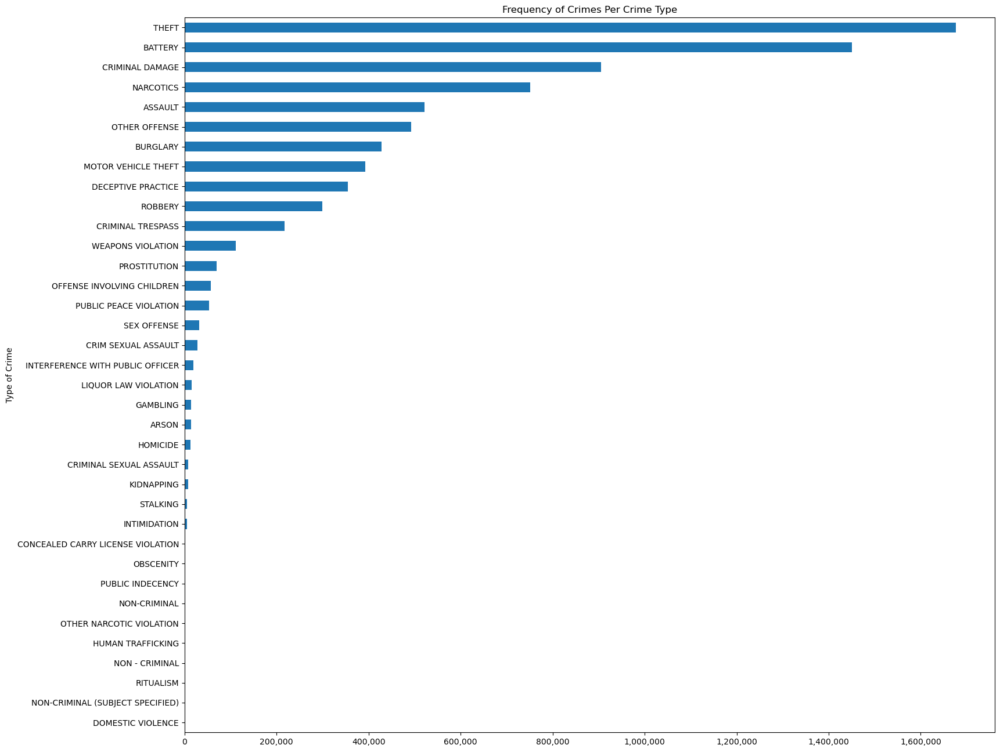

In [11]:

## Plot these for better visualization
crime_type_df = df['Primary Type'].value_counts(ascending=True)

## Some formatting to make it look nicer
fig=plt.figure(figsize=(18, 16))
plt.title("Frequency of Crimes Per Crime Type")
plt.xlabel("Frequency of Crimes")
plt.ylabel("Type of Crime")
ax = crime_type_df.plot(kind='barh')
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

In [12]:
## Check if any rows are missing data and are null
df['Year'].isnull().values.any()

False

In [13]:
## Count number of reported crimes for each year
df['Year'].value_counts()

2002    486809
2001    485898
2003    475987
2004    469427
2005    453774
2006    448179
2007    437090
2008    427187
2009    392829
2010    370518
2011    351998
2012    336327
2013    307544
2014    275803
2016    269849
2017    269115
2018    268930
2015    264811
2019    261386
2022    239054
2023    229611
2020    212254
2021    208963
Name: Year, dtype: int64

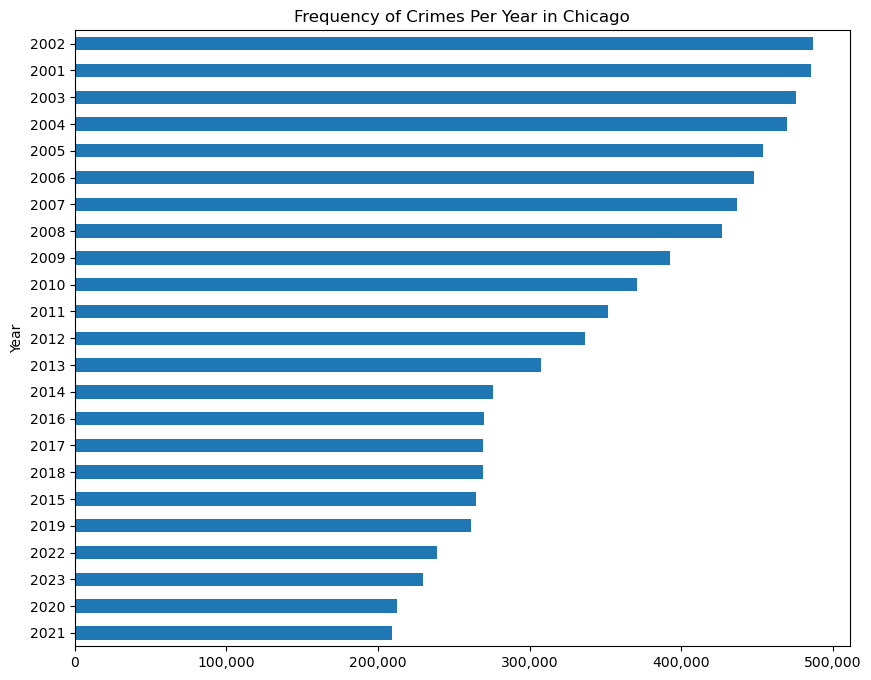

In [14]:
## Plot these for better visualization
crime_year_df = df['Year'].value_counts(ascending=True)

## Some formatting to make it look nicer
fig=plt.figure(figsize=(10, 8))
plt.title("Frequency of Crimes Per Year in Chicago")
plt.xlabel("Frequency of Crimes")
plt.ylabel("Year")
ax = crime_year_df.plot(kind='barh')
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

In [15]:
#Percentage of Arrests that were successfull

In [16]:
## Count number of successful arrests for each year
df['Arrest'].value_counts()

False    5889703
True     2053640
Name: Arrest, dtype: int64

In [17]:

## Convert values into percentages
arrest_df = df['Arrest'].value_counts()
arrest_percent = (arrest_df / df['Arrest'].sum()) * 100 

## Rename Series.name
arrest_percent.rename("% of Arrests",inplace=True)

## Rename True and False to % Arrested and % Not Arrested
arrest_percent.rename({True: '% Arrested', False: '% Not Arrested'},inplace=True)

NameError: name 'make_autopct' is not defined

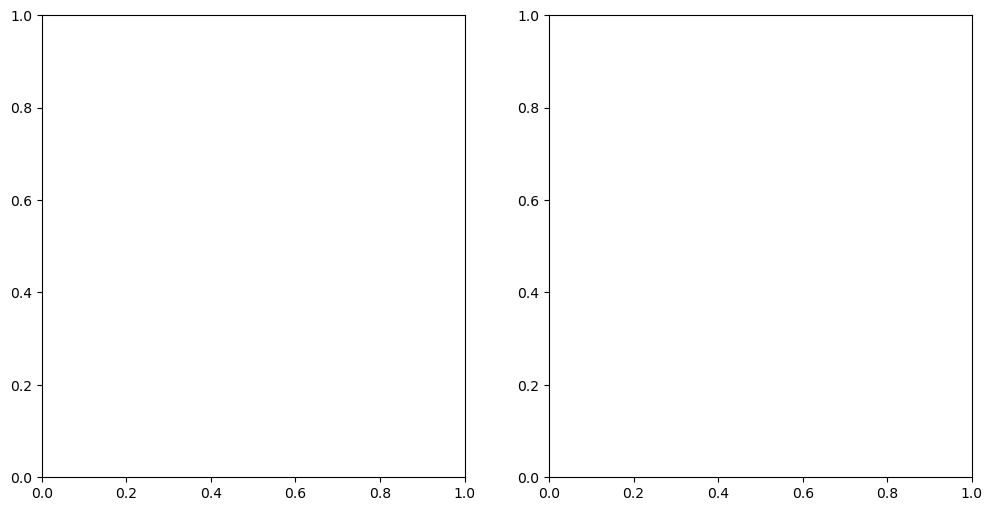

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure with two subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

# Plot a pie chart on the left subplot
arrest_percent.plot.pie(ax=axes[0], autopct=make_autopct(df['Arrest'].value_counts()),
                        wedgeprops=dict(width=0.4, edgecolor='w'),
                        colors=['#66b3ff', '#99ff99'],  # Custom colors
                        startangle=90, counterclock=False, labels=None)

axes[0].set_title("Arrest Percentage")

# Plot a bar chart on the right subplot
sns.countplot(x='Arrest', data=df, palette=['#66b3ff', '#99ff99'], ax=axes[1])
axes[1].set_title("Arrest Count")

# Add labels to the bar chart
for p in axes[1].patches:
    axes[1].annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Add a title to the entire figure
fig.suptitle("Arrest Analysis", fontsize=16)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Display the plot
plt.show()


In [ ]:
#What are the successful arrest percentages per year?

In [19]:
#What are the successful arrest percentages per year?
## Group dataset by year and arrests
arrest_per_year = df.groupby('Year')['Arrest'].value_counts().rename('Counts').to_frame()
arrest_per_year['Percentage'] = (100 * arrest_per_year / arrest_per_year.groupby(level=0).sum())
arrest_per_year.reset_index(level=[1],inplace=True)
arrest_per_year

,Arrest,Counts,Percentage
Year,,,
2001,False,343962,70.788931
2001,True,141936,29.211069
2002,False,345240,70.918985
2002,True,141569,29.081015
2003,False,334399,70.253809
2003,True,141588,29.746191
2004,False,324723,69.174334
2004,True,144704,30.825666
2005,False,312848,68.943571


<Axes: title={'center': 'Percentages of successful arrests from 2001 to 2022'}, xlabel='Year', ylabel='Successful Arrest Percentage'>

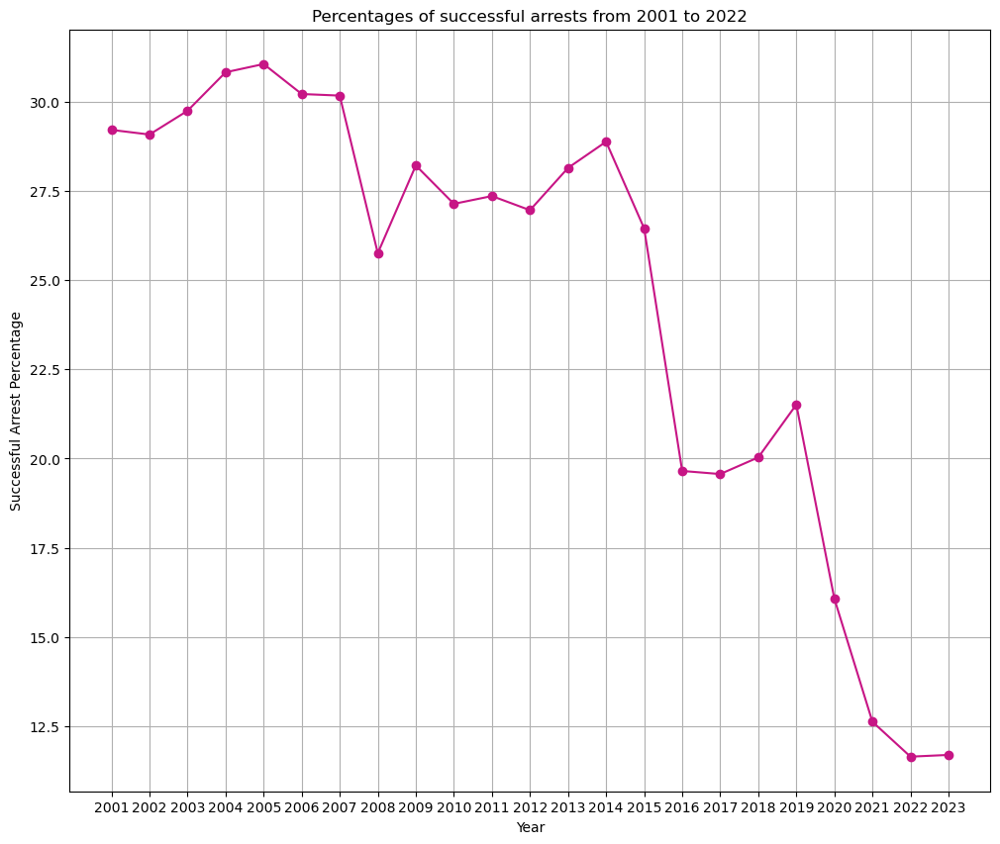

In [20]:
## Create a line plot for percentages of successful arrests over time (2001 to present)
line_plot = arrest_per_year[arrest_per_year['Arrest'] == True]['Percentage']

## Configure line plot to make visualizing data cleaner
labels = line_plot.index.values
fig=plt.figure(figsize=(12, 10))
plt.title('Percentages of successful arrests from 2001 to 2022')
plt.xlabel("Year")
plt.ylabel("Successful Arrest Percentage")
plt.xticks(line_plot.index, line_plot.index.values)

line_plot.plot(grid=True, marker='o', color='mediumvioletred')

In [21]:
import pandas as pd

# Assuming df is your DataFrame
# df = pd.DataFrame(...)  # Create or load your DataFrame
# Remove rows with NaN values
cleaned_df = df.dropna()

# If you want to remove NaN values from specific columns, you can specify them
# df_cleaned = df.dropna(subset=['column1', 'column2'])

# If you want to remove NaN values from all columns, you can use the dropna() method on the entire DataFrame
# df_cleaned = df.dropna()

# Display the cleaned DataFrame
print(cleaned_df)


               ID Case Number                    Date  \
1           25953    JE240540  05/24/2021 03:06:00 PM   
2           26038    JE279849  06/26/2021 09:24:00 AM   
3        13279676    JG507211  11/09/2023 07:30:00 AM   
4        13274752    JG501049  11/12/2023 07:59:00 AM   
6        13203321    JG415333  09/06/2023 05:00:00 PM   
...           ...         ...                     ...   
7943338  13047495    JG229914  04/18/2023 08:00:00 AM   
7943339  13168300    JG373901  08/07/2023 06:00:00 PM   
7943340  13114024    JG309527  06/20/2023 07:00:00 PM   
7943341  13188860    JG398340  08/26/2023 12:00:00 AM   
7943342  13126372    JG324067  07/01/2023 07:29:00 PM   

                             Block  IUCR         Primary Type  \
1              020XX N LARAMIE AVE  0110             HOMICIDE   
2            062XX N MC CORMICK RD  0110             HOMICIDE   
3                 019XX W BYRON ST  0620             BURGLARY   
4        086XX S COTTAGE GROVE AVE  0454              B

In [22]:
!pip install geopandas

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime


In [24]:
# The number of rows and columns in the dataset; returns a tuple
df=pd.read_csv("Crimes_-_2022.csv")
df.shape

(239037, 22)

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239037 entries, 0 to 239036
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    239037 non-null  int64  
 1   Case Number           239037 non-null  object 
 2   Date                  239037 non-null  object 
 3   Block                 239037 non-null  object 
 4   IUCR                  239037 non-null  object 
 5   Primary Type          239037 non-null  object 
 6   Description           239037 non-null  object 
 7   Location Description  238157 non-null  object 
 8   Arrest                239037 non-null  bool   
 9   Domestic              239037 non-null  bool   
 10  Beat                  239037 non-null  int64  
 11  District              239037 non-null  int64  
 12  Ward                  239027 non-null  float64
 13  Community Area        239037 non-null  int64  
 14  FBI Code              239037 non-null  object 
 15  

In [26]:
# First 5 rows of our dataset
df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,12589893,JF109865,01/11/2022 03:00:00 PM,087XX S KINGSTON AVE,1565,SEX OFFENSE,INDECENT SOLICITATION OF A CHILD,RESIDENCE,False,True,423,4,7.0,46,17,1194660.0,1847481.0,2022,09/14/2023 03:41:59 PM,41.736409,-87.562410,"(41.736409029, -87.562410309)"
1,12592454,JF113025,01/14/2022 03:55:00 PM,067XX S MORGAN ST,2826,OTHER OFFENSE,HARASSMENT BY ELECTRONIC MEANS,RESIDENCE,False,True,724,7,16.0,68,26,1170805.0,1860170.0,2022,09/14/2023 03:41:59 PM,41.771782,-87.649437,"(41.771782439, -87.649436929)"
2,12785595,JF346553,08/05/2022 09:00:00 PM,072XX S UNIVERSITY AVE,1544,SEX OFFENSE,SEXUAL EXPLOITATION OF A CHILD,APARTMENT,True,False,324,3,5.0,69,17,1185135.0,1857211.0,2022,09/14/2023 03:41:59 PM,41.763338,-87.597001,"(41.763337967, -87.597001131)"
3,12808281,JF373517,08/14/2022 02:00:00 PM,055XX W ARDMORE AVE,1562,SEX OFFENSE,AGGRAVATED CRIMINAL SEXUAL ABUSE,RESIDENCE,False,False,1621,16,39.0,11,17,1138383.0,1937953.0,2022,09/14/2023 03:41:59 PM,41.985875,-87.766404,"(41.985875279, -87.766403857)"
4,12888104,JF469015,11/10/2022 03:47:00 AM,072XX S MAY ST,1477,WEAPONS VIOLATION,RECKLESS FIREARM DISCHARGE,STREET,False,False,733,7,17.0,68,15,1169903.0,1856822.0,2022,09/14/2023 03:41:59 PM,41.762615,-87.652840,"(41.76261474, -87.652840463)"


In [27]:
# The names of the features
print("The names of the features :\n", list(df.columns))

The names of the features :
 ['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type', 'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat', 'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate', 'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude', 'Location']


In [28]:
# Number of distinct crimes in the city in 2018
crimes = df['Primary Type'].unique()
print("The Number of distinct crimes in Chicago in the year 2018:", len(crimes))
print()
print("The Distinct Crimes are :\n", crimes)

The Number of distinct crimes in Chicago in the year 2018: 31

The Distinct Crimes are :
 ['SEX OFFENSE' 'OTHER OFFENSE' 'WEAPONS VIOLATION' 'THEFT' 'BATTERY'
 'CRIMINAL SEXUAL ASSAULT' 'ROBBERY' 'BURGLARY' 'ARSON'
 'OFFENSE INVOLVING CHILDREN' 'DECEPTIVE PRACTICE' 'ASSAULT'
 'MOTOR VEHICLE THEFT' 'NARCOTICS' 'CRIMINAL DAMAGE' 'INTIMIDATION'
 'STALKING' 'CRIMINAL TRESPASS' 'HOMICIDE'
 'INTERFERENCE WITH PUBLIC OFFICER' 'OBSCENITY' 'PUBLIC PEACE VIOLATION'
 'PROSTITUTION' 'LIQUOR LAW VIOLATION' 'KIDNAPPING'
 'CONCEALED CARRY LICENSE VIOLATION' 'HUMAN TRAFFICKING'
 'OTHER NARCOTIC VIOLATION' 'GAMBLING' 'NON-CRIMINAL' 'PUBLIC INDECENCY']


In [29]:
# What are the total missing values in the dataset ?
print("Number of Missing Values in the whole dataset : ", df.isna().sum().sum())

Number of Missing Values in the whole dataset :  30910


In [30]:
# Let's count number of null entries per feature
missing_values = list(df.isna().sum())
# missing values is a list of the number of missing values in each column

cols = list(df.columns)
col_final = []
for i in range(len(cols)):
    if (missing_values[i] == 0):
        cols[i]="Others"
d = dict(zip(cols, missing_values)) # making a dicionary for the missing values

print("Number of Missing Values per feature >>")
missing_vals = pd.DataFrame(d, index=["Missing Values"]) # Making a custom dataframe from dict d
missing_vals.head()

Number of Missing Values per feature >>


,Others,Location Description,Ward,X Coordinate,Y Coordinate,Latitude,Longitude,Location
Missing Values,0,880,10,6004,6004,6004,6004,6004


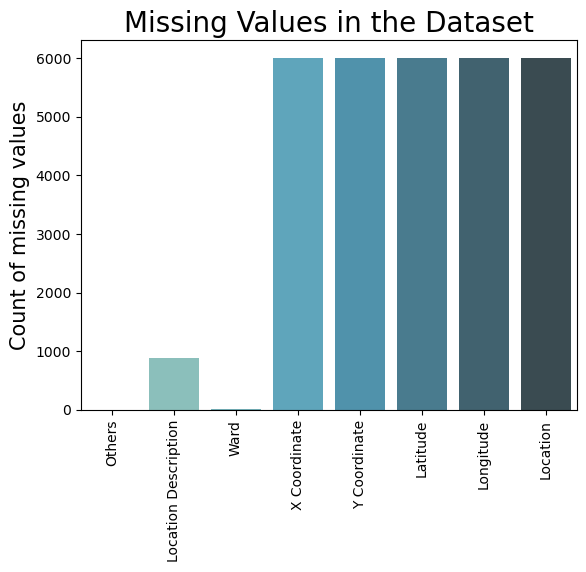

In [31]:
# Plotting the missing values in the dataset
x = list(d.keys())
y = list(d.values())
sns.barplot(x=x, y=y, palette="GnBu_d")
plt.xticks(rotation=90)
plt.title("Missing Values in the Dataset", fontdict = {'fontsize': 20})
plt.ylabel("Count of missing values", fontdict={'fontsize': 15})
plt.show()

In [32]:
#A Bit about the Missing values
Why is data missing in the first place ?

Inspecting the features, we see that all the features that have a large count of missing values are features that relate to the geographical location of the crime scene. This is No Surprise as the Chicago Crime Dataset is based on first hand accounts of people involved in or around the crime. It is not necessary that such first hand reports need to contain the specific locations of the crime.
Disclaimer: These crimes may be based upon preliminary information supplied to the Police Department by the reporting parties that have not been verified. The preliminary crime classifications may be changed at a later date based upon additional investigation and there is always the possibility of mechanical or human error.
Therefore, these missing values can be perfectly accounted for.

We have ##########11,238 missing values in the whole dataset that are present in Location Description, Ward, Community Area, X Co-ordinate, Y Co-ordinate, Latitude, Longitude and Location.
Since, these features are not direct numeric values, we can't use summary statistical functions to fill in the missing values.
Hence, we shall be removing these values from the dataset.

SyntaxError: unterminated string literal (detected at line 9) (3482925485.py, line 9)

In [33]:
# The simplest cleaning technique here would be to drop all the rows with atleast one missing value
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 232452 entries, 0 to 239036
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    232452 non-null  int64  
 1   Case Number           232452 non-null  object 
 2   Date                  232452 non-null  object 
 3   Block                 232452 non-null  object 
 4   IUCR                  232452 non-null  object 
 5   Primary Type          232452 non-null  object 
 6   Description           232452 non-null  object 
 7   Location Description  232452 non-null  object 
 8   Arrest                232452 non-null  bool   
 9   Domestic              232452 non-null  bool   
 10  Beat                  232452 non-null  int64  
 11  District              232452 non-null  int64  
 12  Ward                  232452 non-null  float64
 13  Community Area        232452 non-null  int64  
 14  FBI Code              232452 non-null  object 
 15  

In [34]:
# How much of the data has been retained after this removal ?
print(round(232452 / 239036 * 100,2), "percentage of the data has been retained.")

97.25 percentage of the data has been retained.


In [35]:
# Continuous Variables
cont = df._get_numeric_data().columns
print("The continuous variables are: ",list(cont))

The continuous variables are:  ['ID', 'Arrest', 'Domestic', 'Beat', 'District', 'Ward', 'Community Area', 'X Coordinate', 'Y Coordinate', 'Year', 'Latitude', 'Longitude']


In [36]:
# Categorical Variables
print("The categorical variables are: ",list(set(df.columns) - set(cont)))


The categorical variables are:  ['IUCR', 'Location', 'Primary Type', 'Case Number', 'Updated On', 'Date', 'FBI Code', 'Block', 'Description', 'Location Description']


/var/folders/89/cwnqfp9972zf64_x30z0tpcw0000gn/T/ipykernel_17849/3491880091.py:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


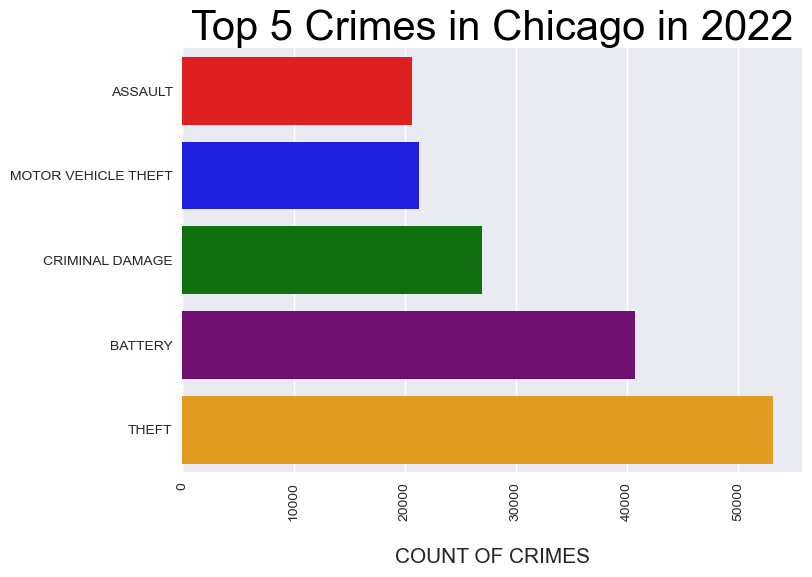

In [37]:
# Set the style of the plot first
plt.style.use('seaborn')

# Filter out the Top 5 crimes
top_5_crimes = df['Primary Type'].value_counts().sort_values(ascending=False).head()

temp = df.groupby('Primary Type', as_index=False).agg({"ID": "count"})
temp = temp.sort_values(by=['ID'], ascending=False).head()
temp = temp.sort_values(by='ID', ascending=True)
sns.barplot(x='ID', y='Primary Type', data=temp, palette=['red', 'blue', 'green', 'purple', 'orange'])

# Work on the aestehtic appeal of the plot
plt.title("Top 5 Crimes in Chicago in 2022", fontdict = {'fontsize': 30, 'fontname':'Arial', 'color': '#000000'})
plt.xlabel("\nCOUNT OF CRIMES", fontdict = {'fontsize': 15})
plt.ylabel("")
plt.xticks(rotation=90)
plt.show()
#plt.show()

In [38]:
# Doing a bit of df manipulation for using bokeh
temp.head()
temp.columns=['Crime','Number']
temp.index=[0,1,2,3,4]
temp['co-ordinates']=[1,2,3,4,5]
temp.head()

,Crime,Number,co-ordinates
0,ASSAULT,20692,1
1,MOTOR VEHICLE THEFT,21247,2
2,CRIMINAL DAMAGE,26912,3
3,BATTERY,40687,4
4,THEFT,53137,5


In [39]:
from bokeh.plotting import figure
from bokeh.io import show, output_notebook
from bokeh.models import ColumnDataSource, HoverTool

temp_cds = ColumnDataSource(temp)

fig1 = figure(width=700, height=400, title="Most occurring Criminal Offences in Chicago",
              x_axis_label="Count of Crimes", y_axis_label="Crime Type", x_range=(0, 70000))

fig1.title.align = "left"
fig1.title.text_color = "black"

fig1.title.text_font_size = "20px"

fig1.hbar(y='co-ordinates', right='Number', source=temp_cds, left=0, color='red', alpha=0.5, height=0.50)
fig1.yaxis.major_label_overrides = {5: 'Theft', 4:'Battery', 3:'Criminal Damage', 2:'Assault',
                                   1:'Deceptive Practice'}

# Adding passive interactivity
tooltips = [
    ('Number of Crimes', '@Number'),
]

#fig1.legend.location
fig1.add_tools(HoverTool(tooltips=tooltips))

output_notebook()
show(fig1)


Loading BokehJS ...

In [ ]:
#Most Occurring Top 5 Crimes in Chicago in 2018
#Theft
#Battery
#Criminal Damage
#Assault
#Deceptive Practice

In [41]:
# Testing out our code
from datetime import datetime

month = s1[:2]
date = s1[3:5]
year = s1[6:10]

final_date = datetime(int(year), int(month), int(date), int(hr), int(mins), int(sec))
print(final_date)

2022-12-20 16:30:00


In [42]:
# Testing out the time and date conversion for one entry

t = df['Date'][20]
print(t)
s1 = t[:11] 
print(s1)
s2 = t[11:]
print(s2)

print(s2)
hr = s2[:2]
mins = s2[3:5]
sec = s2[6:8]
time_frame = s2[9:]
if(time_frame == 'PM'):
    if (int(hr) != 12):
        hr = str(int(hr) + 12)
else:
    if(int(hr) == 12):
        hr = '00'

print(hr, mins, sec)

12/20/2022 04:30:00 PM
12/20/2022 
04:30:00 PM
04:30:00 PM
16 30 00


In [43]:
# Time Conversion Function
def time_convert(date_time):
    s1 = date_time[:11]
    s2 = date_time[11:]
    
    month = s1[:2]
    date = s1[3:5]
    year = s1[6:10]
    
    hr = s2[:2]
    mins = s2[3:5]
    sec = s2[6:8]
    time_frame = s2[9:]
    if(time_frame == 'PM'):
        if (int(hr) != 12):
            hr = str(int(hr) + 12)
    else:
        if(int(hr) == 12):
            hr = '00'
    
    final_date = datetime(int(year), int(month), int(date), int(hr), int(mins), int(sec))
    return final_date

In [44]:
# Using apply() of pandas to apply time_convert on every row of the Date column
df['Date'] = df['Date'].apply(time_convert)

In [45]:
#Feature Engineering 1 : Create a new column "Month"


In [46]:
def month(x):
    return x.strftime("%B")
df['Month'] = df['Date'].apply(month)
print(df.Month)

0           January
1           January
2            August
3            August
4          November
            ...    
239032    September
239033         June
239034     February
239035         June
239036       August
Name: Month, Length: 232452, dtype: object


In [49]:
# Frequency of the most occuring crimes over the year 2018

theft_dict ={} # dictionary
battery_dict = {}
crim_dam = {}
assault = {}
dec_prac = {}

months = df["Month"].unique()
for month in months :
    theft_dict[month]=0
    battery_dict[month]=0
    crim_dam[month]=0
    assault[month]=0
    dec_prac[month]=0

for elem in df[df["Primary Type"]=="THEFT"]["Month"]:
    if elem in theft_dict.keys():
        theft_dict[elem] += 1

for elem in df[df["Primary Type"]=="BATTERY"]["Month"]:
    if elem in battery_dict.keys():
        battery_dict[elem] += 1
        
for elem in df[df["Primary Type"]=="CRIMINAL DAMAGE"]["Month"]:
    if elem in crim_dam.keys():
        crim_dam[elem] += 1
        
for elem in df[df["Primary Type"]=="ASSAULT"]["Month"]:
    if elem in assault.keys():
        assault[elem] += 1
        
for elem in df[df["Primary Type"]=="DECEPTIVE PRACTICE"]["Month"]:
    if elem in dec_prac.keys():
        dec_prac[elem] += 1
        
        
# Let's order the above dictionaries for proper plotting
months=['January','February','March','April','May','June','July','August','September','October','November','December']
theft_list = [(k,theft_dict[k]) for k in months]
battery_list = [(k,battery_dict[k]) for k in months]
crim_dam_list = [(k,crim_dam[k]) for k in months]
assault_list = [(k,assault[k]) for k in months]
dec_prac_list = [(k,dec_prac[k]) for k in months]

/var/folders/89/cwnqfp9972zf64_x30z0tpcw0000gn/T/ipykernel_17849/1717674762.py:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark')


ValueError: 'darkpurple' is not a valid value for color

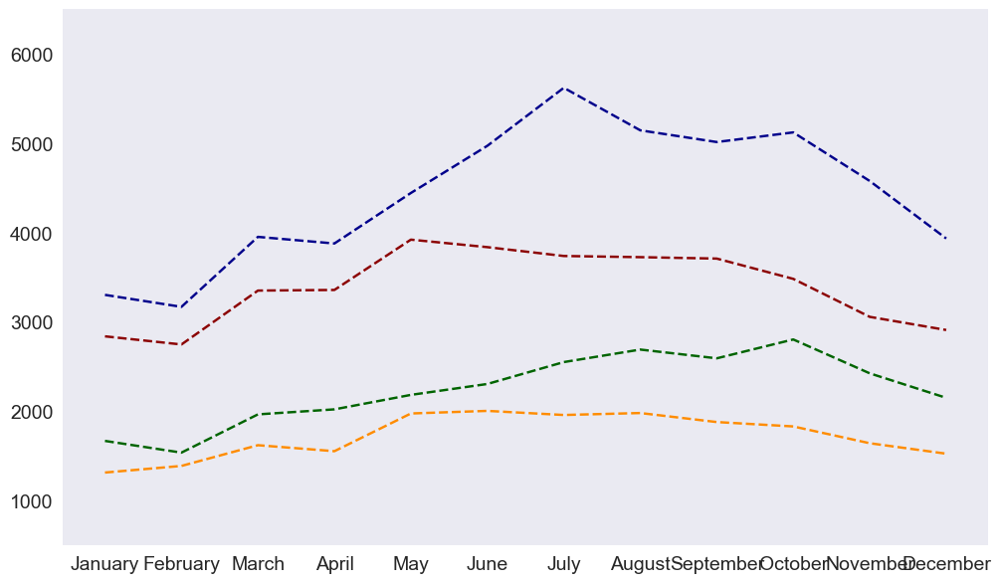

In [50]:
# Plotting the graphs

plt.style.use('seaborn-dark')
fig, ax = plt.subplots(figsize=(12, 7))

ax.spines["top"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.spines["right"].set_visible(False)    
ax.spines["left"].set_visible(False)  

# Setting the ticks only on the bottom and the left of the graph
ax.get_xaxis().tick_bottom()    
ax.get_yaxis().tick_left()   

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.ylim(500, 6500)

x = [z[0] for z in theft_list]
y = [z[1] for z in theft_list]
ax.plot(x, y, color="darkblue")  # Change color to dark blue
ax.lines[0].set_linestyle("--")

x = [z[0] for z in battery_list]
y = [z[1] for z in battery_list]
ax.plot(x, y, color="darkred")  # Change color to dark red
ax.lines[1].set_linestyle("--")

x = [z[0] for z in crim_dam_list]
y = [z[1] for z in crim_dam_list]
ax.plot(x, y, color="darkgreen")  # Change color to dark green
ax.lines[2].set_linestyle("--")

x = [z[0] for z in assault_list]
y = [z[1] for z in assault_list]
ax.plot(x, y, color="darkorange")  # Change color to dark orange
ax.lines[3].set_linestyle("--")

x = [z[0] for z in dec_prac_list]
y = [z[1] for z in dec_prac_list]
ax.plot(x, y, color="darkpurple")  # Change color to dark purple
ax.lines[4].set_linestyle("--")

for tick in ax.get_xticklabels():
    tick.set_rotation(90)

plt.text(10, 5400, "Theft", fontsize=18)
plt.text(10, 3500, "Battery", fontsize=18, color="darkred")
plt.text(10, 2400, "Criminal\nDamage", fontsize=18, color="darkgreen")
plt.text(10, 1700, "Assault", fontsize=18, color="darkorange")
plt.text(10, 500, "Deceptive\nPractice", fontsize=18, color="darkpurple")

ax.set_title("Frequency of Most Occurring Top 5 Crimes\n", fontname="monospace", fontsize=20)
ax.set_xlabel("Month", fontsize=18)
ax.set_ylabel("Number of Crimes\n", fontsize=16)

plt.show()


In [51]:
# Dataframes for each crime (Will be used in the further parts of our analysis)

theft_df = df[df['Primary Type']=='THEFT']
battery_df = df[df['Primary Type']=='BATTERY'] 
crim_dam_df = df[df['Primary Type']=='CRIMINAL DAMAGE']
assault_df = df[df['Primary Type']=='ASSAULT']
dec_prac_df = df[df['Primary Type']=='DECEPTIVE PRACTICE']

In [ ]:
<h2>2. Arrests and the state of Chicago</h2>
<h3>Likelihood of an arrest</h3>

In [52]:
# df['Arrest'].head()
l = df["Arrest"].value_counts()
false = l[0]
true = l[1]

arrest = pd.DataFrame({'Status':['Not Arrested','Arrested'],'Value':list(l)})
print("Percentage of no arrests of all reported crimes :",false/(false+true)*100,'!')

Percentage of no arrests of all reported crimes : 88.40878977165178 !


In [ ]:
<p>That's a stoking <strong>80%</strong> chance for evading an arrest!</p>

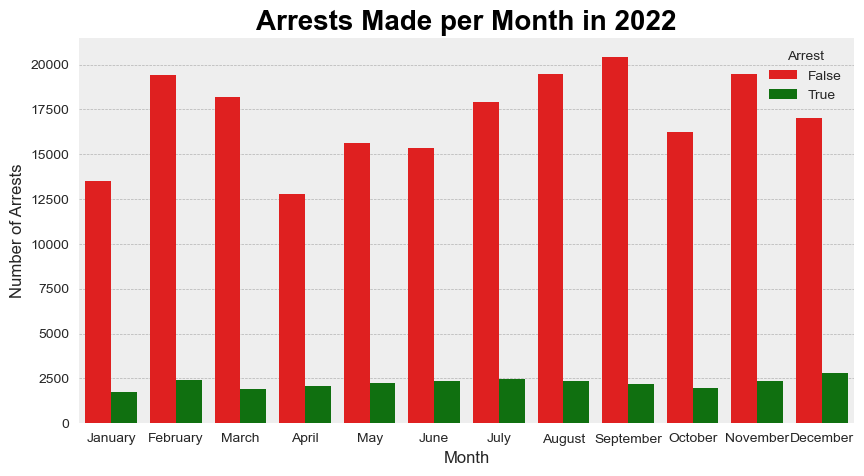

In [53]:
# How are arrests spread out across the months
plt.style.use('bmh')

fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.countplot(x="Month",
                   hue='Arrest',
                   data=df[['Month','Arrest']],
                   palette=['Red', 'Green'])
months = ['January','February','March','April','May','June','July',\
             'August','September','October','November','December']    

ax.set(title='Arrests Made per Month in 2022', xlabel='Month', ylabel='Number of Arrests', xticklabels=months)
plt.title('Arrests Made per Month in 2022', fontdict={'fontsize': 20, 'color': 'black'}, weight="bold")
plt.show()

In [ ]:
<h3>How do arrests vary among the type of crime ?</h3>

In [54]:
# let's look at the pandas groupby function
#arrest_crime = df.groupby(['Primary Type', 'Arrest'])['ID'].count()
arrest_crime = df.groupby(['Primary Type', 'Arrest']).agg({'Arrest':"count"})
arrest_crime.columns = ["Count"]
# arrest_crime

In [55]:
import math
from bokeh.models import ColumnDataSource, Legend, HoverTool
from bokeh.plotting import figure, output_notebook, show


the_crimes = ['THEFT', 'BATTERY', 'CRIMINAL DAMAGE', 'ASSAULT', 'DECEPTIVE PRACTICE', 'WEAPONS VIOLATION', 'NARCOTICS',
              'HOMICIDE', 'BURGLARY', 'INTERFERENCE WITH PUBLIC OFFICER']

# Create the dataframe arrest
arrest = pd.DataFrame(columns=['Crime', 'True', 'False'])

# First, we make our dataset
for i, crime in enumerate(the_crimes):
    subset = df[df['Primary Type'] == crime]
    true = subset['Arrest'].value_counts().sort_index()[1]
    false = subset['Arrest'].value_counts().sort_index()[0]
    temp_df = pd.DataFrame({'Crime': [crime], 'True': [true], 'False': [false]})
    arrest = pd.concat([arrest, temp_df], ignore_index=True)

arrest['True_per'] = arrest['True'] / (arrest['True'] + arrest['False']) * 100
arrest['False_per'] = arrest['False'] / (arrest['True'] + arrest['False']) * 100

# arrest is our dataset

# Create the figure
fig2 = figure(x_range=the_crimes, width=700, height=700, title='Arrests vs Crime Type',
              x_axis_label='Arrest Status', y_axis_label='Number of Crimes')

# Assuming arrest_cds is your ColumnDataSource
arrest_cds = ColumnDataSource(arrest)

# Stack the bars
fig2.vbar_stack(stackers=['True', 'False'], x='Crime', width=0.25, source=arrest_cds, color=['green', 'red'])
fig2.xaxis.major_label_orientation = math.pi/2

# Create the legend
legend = Legend(title="Arrest Status", location="top_center")
legend.items = [
    ("Arrested", [fig2.renderers[0]]),  # Assuming the first renderer corresponds to "Arrested"
    ("Not Arrested", [fig2.renderers[1]])  # Assuming the second renderer corresponds to "Not Arrested"
]

fig2.add_layout(legend, 'right')


# Add tooltips and hover tools
tooltips = [('Crime', '@Crime'), ('Arrested Percentage', '@True_per'), ('Not Arrested Percentage', '@False_per')]
hover = HoverTool(tooltips=tooltips, mode='vline')
fig2.add_tools(hover)

# Output to notebook and show the figure
output_notebook()
show(fig2)


Loading BokehJS ...

In [ ]:
Crime VS Time
Distribution of crime across months

In [56]:
print(df.columns)

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location', 'Month'],
      dtype='object')


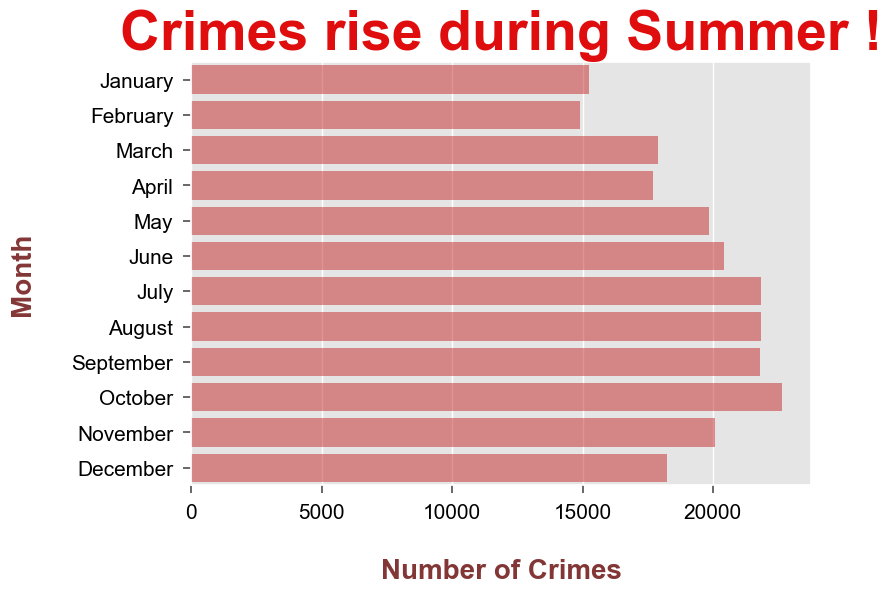

In [57]:
# Set plot style
plt.style.use('ggplot')
sns.set_context('notebook')

# Code to plot
sns.countplot(y='Month', data=df, palette=["#DF0D0D"], order=['January', 'February', 'March', 'April', 'May', 'June', "July", 'August', 'September', 'October', 'November', 'December'], alpha=0.5)

# Aesthetic appeal of the plot 
plt.title("Crimes rise during Summer !", fontdict={'fontsize': 40, 'color': '#DF0D0D', 'fontname':'Arial'}, weight="bold")
plt.ylabel("Month\n", fontdict={'fontsize': 20, 'weight': 'bold', 'color': "#833636"})
plt.xlabel("\nNumber of Crimes", fontdict={'fontsize': 20, 'weight': 'bold', 'color': "#833636"})

plt.xticks(fontsize=15, color='black')
plt.yticks(fontsize=15, color='black')
plt.show()


In [ ]:
#he months of May, June, July and August have seen the most spike in crime rates in the city.
It is very important here that we are able to make an intuitive observation that Crime rises in the Summer!

In [ ]:
Create a new column "Hour" [24 hour format]


In [62]:
def hour(x):
    return x.strftime("%H")
df['Hour_Day'] = df['Date'].apply(hour)

/var/folders/89/cwnqfp9972zf64_x30z0tpcw0000gn/T/ipykernel_17849/1919554506.py:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark')


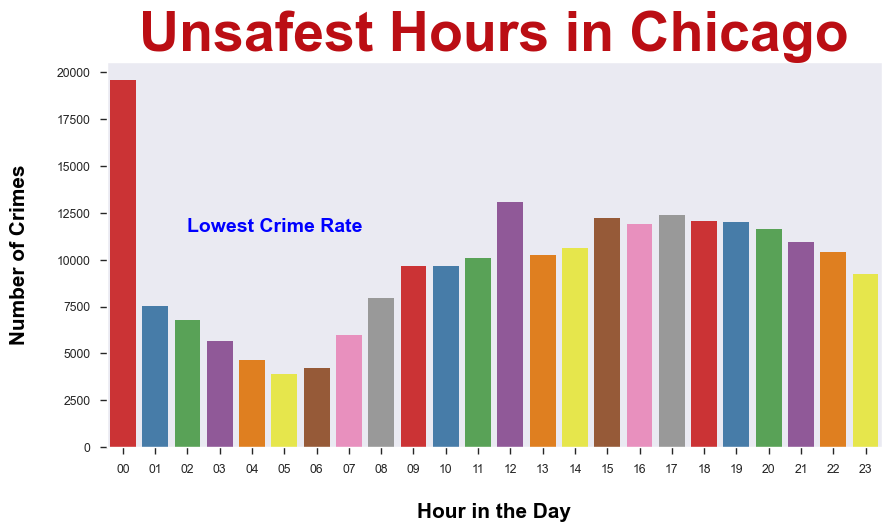

In [67]:
# Set plot style
plt.style.use('seaborn-dark')
sns.set_context('paper')

# Define the order of hours (assuming 'Hour_Day' is a numerical column)
hour_order = sorted(df['Hour_Day'].unique())

# Write code to plot with 'Pastel1' color palette
fig, ax = plt.subplots(figsize=(10, 5))
sns.countplot(x='Hour_Day', data=df, palette="Set1", order=hour_order)  # Set order based on actual hour values

# Aesthetic appeal
plt.title("Unsafest Hours in Chicago", fontdict={'fontsize': 40, 'color': '#bb0e14', 'fontname': 'Arial'}, weight="bold")
plt.xlabel("\nHour in the Day", fontdict={'fontsize': 15, 'color': 'black', 'weight': 'bold'})
plt.ylabel("Number of Crimes\n", fontdict={'fontsize': 15, 'color': 'black', 'weight': 'bold'})

# Add Text to the plot
plt.text(2, 11500, 'Lowest Crime Rate', fontdict={'fontsize': 14, 'color': "blue", 'weight': 'bold'})

plt.show()


In [ ]:
<p>Crime rate slumps from midnight (00 hours) to 05 hours.<br>
    <strong>Well, Criminals need sleep too!</strong>
</p>

In [ ]:
#During Day Crime Patterns

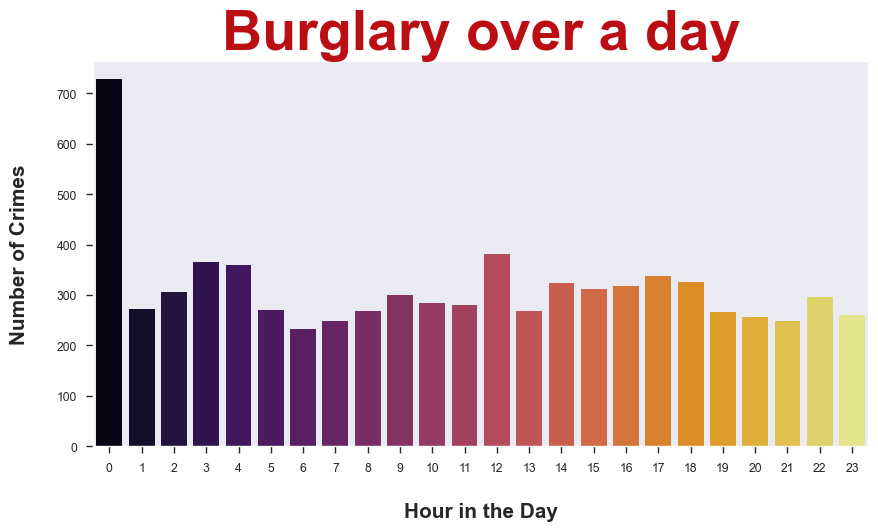

In [68]:
# analyse only for burglary
burglary_df = df[df['Primary Type']=='BURGLARY']
hours = [int(x) for x in list(burglary_df['Hour_Day'].unique())]
hours = sorted(hours)
# print(hours)

bur_cri = list(burglary_df['Hour_Day'].value_counts().sort_index())
# print(bur_cri)

fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x=hours, y=bur_cri, palette='inferno')

# Aesthetic appeal
plt.title("Burglary over a day", fontdict={'fontsize': 40, 'color': '#bb0e14','fontname':'Arial'}, weight="bold")
plt.xlabel("\nHour in the Day", fontdict={'fontsize': 15}, weight='bold')
plt.ylabel("Number of Crimes\n", fontdict={'fontsize': 15}, weight="bold")

# show plot
plt.show()

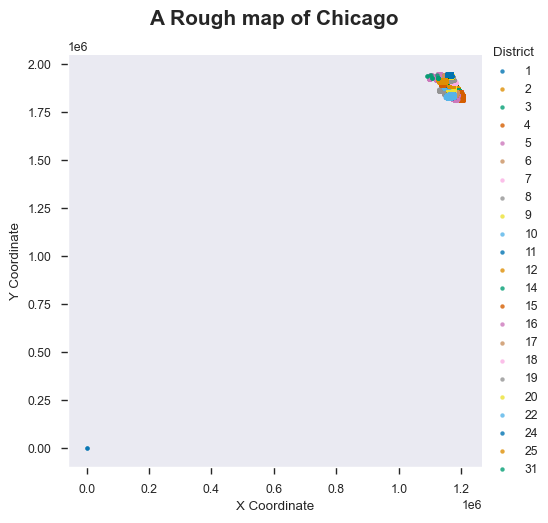

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame

# Let's simulate the map of Chicago with the help of X and Y coordinates
sns.lmplot(x='X Coordinate',
           y='Y Coordinate',
           data=df,
           fit_reg=False,  # No regression line
           hue="District",
           palette='colorblind',
           height=5,
           scatter_kws={"marker": "+", "s": 10})

ax = plt.gca()
ax.set_title("A Rough map of Chicago\n", fontdict={'fontsize': 15}, weight="bold")

plt.show()


In [70]:
## Crime data distribution of gang based criminal activities
import folium

dp=df[df['Primary Type']=='DECEPTIVE PRACTICE']
battery = df[df['Primary Type']=='BATTERY']
cd = df[df['Primary Type']=='CRIMINAL DAMAGE']
mtheft = df[df['Primary Type']=='MOTOR VEHICLE THEFT']
theft = df[df['Primary Type']=='THEFT']
narcotics= df[df['Primary Type']=='NARCOTICS']
merge = cd.append(battery)
merge = merge.append(mtheft)
#merge = merge.append(cd)
merge = merge.append(dp)
merge = merge.append(theft)
merge = merge.append(narcotics)
chicago_map = folium.Map(location=[41.864073,-87.706819],
                        zoom_start=11,
                        tiles="openstreetmap")
locations = merge.groupby('Primary Type').nth(7)


new_locations = locations.loc[:, ['Latitude', 'Longitude', 'Location Description', 'Arrest']]


print(new_locations.head(6))


popup_text = """Community Index : {}<br
                Arrest : {}<br>
                Location Description : {}<br>"""


for i in range(len(new_locations)):
    lat = new_locations.iloc[i][0]
    long = new_locations.iloc[i][1]
    popup_text = """Community Index : {}<br>
                Arrest : {}<br>
                Location Description : {}<br>"""
    popup_text = popup_text.format(new_locations.index[i],
                               new_locations.iloc[i][-1],
                               new_locations.iloc[i][-2]
                               )
    folium.CircleMarker(location = [lat, long], popup= popup_text, fill = True).add_to(chicago_map)


#chicago_map.save('map.html')
display(chicago_map)

#chicago_map._build_map()


                      Latitude  Longitude  \
Primary Type                                
BATTERY              41.930855 -87.651974   
CRIMINAL DAMAGE      41.885700 -87.641727   
DECEPTIVE PRACTICE   41.733245 -87.649630   
MOTOR VEHICLE THEFT  41.711870 -87.599321   
NARCOTICS            41.866415 -87.705004   
THEFT                42.019399 -87.675049   

                                       Location Description  Arrest  
Primary Type                                                         
BATTERY                                           APARTMENT    True  
CRIMINAL DAMAGE      PARKING LOT / GARAGE (NON RESIDENTIAL)   False  
DECEPTIVE PRACTICE                                RESIDENCE   False  
MOTOR VEHICLE THEFT               CHA PARKING LOT / GROUNDS   False  
NARCOTICS                                          SIDEWALK    True  
THEFT                                    GROCERY FOOD STORE   False  


/var/folders/89/cwnqfp9972zf64_x30z0tpcw0000gn/T/ipykernel_17849/1015650897.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  merge = cd.append(battery)
/var/folders/89/cwnqfp9972zf64_x30z0tpcw0000gn/T/ipykernel_17849/1015650897.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  merge = merge.append(mtheft)
/var/folders/89/cwnqfp9972zf64_x30z0tpcw0000gn/T/ipykernel_17849/1015650897.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  merge = merge.append(dp)
/var/folders/89/cwnqfp9972zf64_x30z0tpcw0000gn/T/ipykernel_17849/1015650897.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  merge = merge.append(theft)
/var/folders/89/cwn

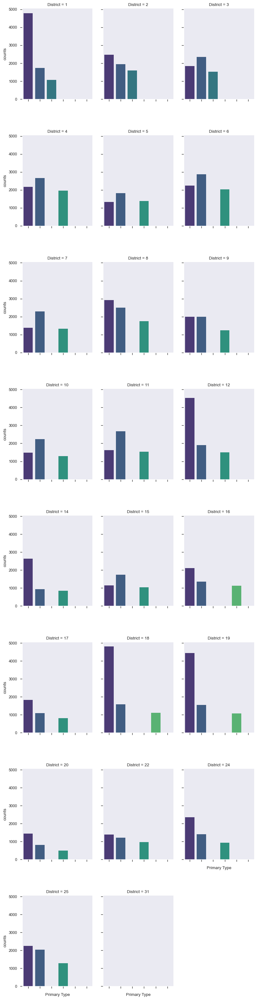

In [71]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame

top = df.groupby(['District', 'Primary Type']).size().reset_index(name='counts').groupby('District').apply(lambda x: x.sort_values('counts', ascending=False).head(3))

# factor plot to make multiple plots
g = sns.catplot(x='Primary Type', y='counts', col='District', col_wrap=3,
                data=top, kind='bar', height=4, aspect=0.7, palette='viridis')

# Adjust x-axis labels for better visibility
for ax in g.axes:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4)

plt.show()


In [72]:
## Crime data distribution of gang based criminal activities
import folium

dp=df[df['Primary Type']=='DECEPTIVE PRACTICE']
battery = df[df['Primary Type']=='BATTERY']
cd = df[df['Primary Type']=='CRIMINAL DAMAGE']
mtheft = df[df['Primary Type']=='MOTOR VEHICLE THEFT']
theft = df[df['Primary Type']=='THEFT']
narcotics= df[df['Primary Type']=='NARCOTICS']
merge = cd.append(battery)
merge = merge.append(mtheft)
#merge = merge.append(cd)
merge = merge.append(dp)
merge = merge.append(theft)
merge = merge.append(narcotics)
chicago_map = folium.Map(location=[41.864073,-87.706819],
                        zoom_start=11,
                        tiles="openstreetmap")
locations = merge.groupby('Primary Type').nth(7)


new_locations = locations.loc[:, ['Latitude', 'Longitude', 'Location Description', 'Arrest']]


print(new_locations.head(6))


popup_text = """Community Index : {}<br
                Arrest : {}<br>
                Location Description : {}<br>"""


for i in range(len(new_locations)):
    lat = new_locations.iloc[i][0]
    long = new_locations.iloc[i][1]
    popup_text = """Community Index : {}<br>
                Arrest : {}<br>
                Location Description : {}<br>"""
    popup_text = popup_text.format(new_locations.index[i],
                               new_locations.iloc[i][-1],
                               new_locations.iloc[i][-2]
                               )
    folium.CircleMarker(location = [lat, long], popup= popup_text, fill = True).add_to(chicago_map)


#chicago_map.save('map.html')
display(chicago_map)

#chicago_map._build_map()


                      Latitude  Longitude  \
Primary Type                                
BATTERY              41.930855 -87.651974   
CRIMINAL DAMAGE      41.885700 -87.641727   
DECEPTIVE PRACTICE   41.733245 -87.649630   
MOTOR VEHICLE THEFT  41.711870 -87.599321   
NARCOTICS            41.866415 -87.705004   
THEFT                42.019399 -87.675049   

                                       Location Description  Arrest  
Primary Type                                                         
BATTERY                                           APARTMENT    True  
CRIMINAL DAMAGE      PARKING LOT / GARAGE (NON RESIDENTIAL)   False  
DECEPTIVE PRACTICE                                RESIDENCE   False  
MOTOR VEHICLE THEFT               CHA PARKING LOT / GROUNDS   False  
NARCOTICS                                          SIDEWALK    True  
THEFT                                    GROCERY FOOD STORE   False  


/var/folders/89/cwnqfp9972zf64_x30z0tpcw0000gn/T/ipykernel_17849/1015650897.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  merge = cd.append(battery)
/var/folders/89/cwnqfp9972zf64_x30z0tpcw0000gn/T/ipykernel_17849/1015650897.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  merge = merge.append(mtheft)
/var/folders/89/cwnqfp9972zf64_x30z0tpcw0000gn/T/ipykernel_17849/1015650897.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  merge = merge.append(dp)
/var/folders/89/cwnqfp9972zf64_x30z0tpcw0000gn/T/ipykernel_17849/1015650897.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  merge = merge.append(theft)
/var/folders/89/cwn

In [73]:
a=''
a=input("enter a criminal activity for frequency of a crime in location ")
a=a.upper()
var=df[df['Primary Type']==a]
unique_locations = var['Location'].value_counts()
print("%%%%%%%%%%%%%%%%%%%%%%%%%%% ",len(unique_locations))
#print("%%%%%%%%%%%%%%%%%%%%%%%%%%% ",unique_locations)


unique_locations.index


CR_index = pd.DataFrame({"Raw_String" : unique_locations.index, "ValueCount":unique_locations})
CR_index.index = range(len(unique_locations))
print(CR_index.head())
print("valuecount",len(CR_index['ValueCount']))
def Location_extractor(Raw_Str):
    preProcess = Raw_Str[1:-1].split(',')
    lat =  float(preProcess[0])
    long = float(preProcess[1])
    return (lat, long)


CR_index['LocationCoord'] = CR_index['Raw_String'].apply(Location_extractor)


CR_index  = CR_index.drop(columns=['Raw_String'], axis = 1)


#chicago_map._build_map()
#%%time

chicago_map_crime = folium.Map(location=[41.895140898, -87.624255632],
                        zoom_start=13,
                        tiles="openstreetmap")

for i in range(500):
    lat = CR_index['LocationCoord'].iloc[i][0]
    long = CR_index['LocationCoord'].iloc[i][1]
    radius = CR_index['ValueCount'].iloc[i] / 50
    
    if CR_index['ValueCount'].iloc[i] > 60:
        color = "#FF4500"
    else:
        color = "#008080"
    
    popup_text = """Latitude : {}<br>
                Longitude : {}<br>
                Criminal Incidents : {}<br>"""
    popup_text = popup_text.format(lat,
                               long,
                               CR_index['ValueCount'].iloc[i]
                               )
    folium.CircleMarker(location = [lat, long], popup= popup_text,radius = radius, color = color, fill = True).add_to(chicago_map_crime)
    
#chicago_map_crime.save('crime.html')

display(chicago_map_crime)


enter a criminal activity for frequency of a crime in location  narcotics


%%%%%%%%%%%%%%%%%%%%%%%%%%%  3200
                      Raw_String  ValueCount
0  (41.868180939, -87.709271389)          23
1  (41.880399914, -87.753008553)          23
2    (41.865713975, -87.7251516)          19
3  (41.896216334, -87.719999212)          15
4  (41.884813067, -87.714199454)          15
valuecount 3200


In [ ]:
#Region of concentration of gang acitivty 

Enter the crime you wish to see the concentration of in the city >>  narcotics


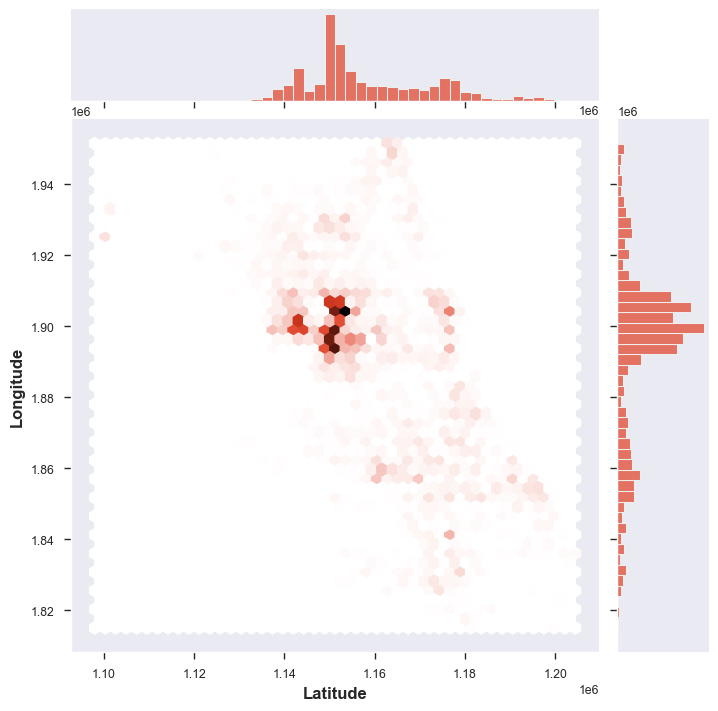

In [74]:
# let's take in the crime as an input as always
c = input("Enter the crime you wish to see the concentration of in the city >> ")
crime_df = df[df['Primary Type']==c.upper()]

sns.jointplot(x=crime_df['X Coordinate'].values, y=crime_df['Y Coordinate'].values, height=7, kind='hex')

plt.xlabel("Latitude", fontdict={'fontsize': 12}, weight='bold')
plt.ylabel("Longitude", fontdict={'fontsize': 12}, weight="bold")
plt.show()

In [ ]:
df.head()

In [ ]:
# Visulaizing Narcotics

In [75]:
narc=df[df['Primary Type']=='NARCOTICS']
narc_data=pd.DataFrame({"Counts":narc['Description'].value_counts(),"Description":narc['Description'].value_counts().index})
narc_data.reset_index(inplace=True)
narc_data=narc_data.drop(columns=['index'],axis=1)
narc_data.head()

,Counts,Description
0,768,POSSESS - HEROIN (WHITE)
1,531,POSSESS - CANNABIS MORE THAN 30 GRAMS
2,445,FOUND SUSPECT NARCOTICS
3,389,POSSESS - CRACK
4,336,POSSESS - CANNABIS 30 GRAMS OR LESS


<Axes: xlabel='Counts', ylabel='Description'>

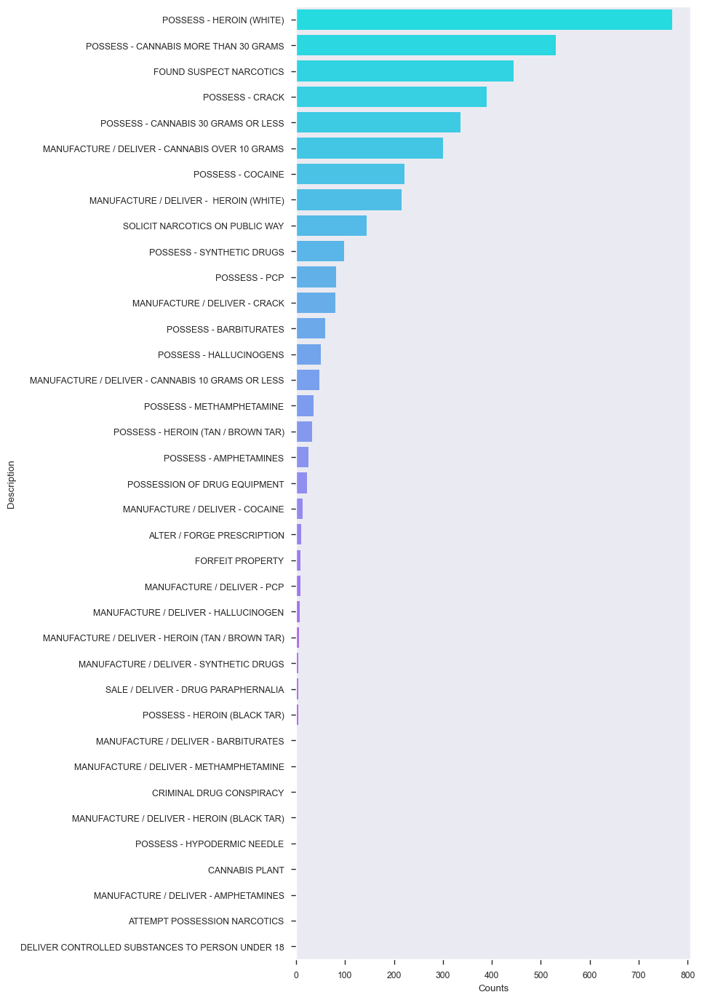

In [95]:
plt.figure(figsize=(7,17))
sns.barplot(y="Description", x= "Counts", data=narc_data, palette="cool")

In [76]:
import folium
from folium.plugins import MarkerCluster

# Filter data for Primary Type 'NARCOTICS'
narcotics_data = df[df['Primary Type'] == 'NARCOTICS']

# Create a base map centered around Chicago
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# Create a MarkerCluster
marker_cluster = MarkerCluster().add_to(chicago_map)

# Add markers for each incident to the cluster
for index, row in narcotics_data.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']],
                  popup=f"{row['Location Description']}<br>({row['Latitude']:.4f}, {row['Longitude']:.4f})",
                  icon=folium.Icon(color='red')).add_to(marker_cluster)

# Display the map
chicago_map
import folium
from folium.plugins import MarkerCluster

# Filter data for Primary Type 'NARCOTICS'
narcotics_data = df[df['Primary Type'] == 'NARCOTICS']

# Create a base map centered around Chicago
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# Create a MarkerCluster
marker_cluster = MarkerCluster().add_to(chicago_map)

# Add markers for each incident to the cluster
for index, row in narcotics_data.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']],
                  popup=f"{row['Location Description']}<br>({row['Latitude']:.4f}, {row['Longitude']:.4f})",
                  icon=folium.Icon(color='red')).add_to(marker_cluster)

# Display the map
chicago_map


In [ ]:
#Sin District

In [77]:
crimes = df['District'].unique()
crimes

array([ 4,  7,  3, 16, 12, 24, 18, 19,  6,  8, 14,  1, 11, 10, 25,  2,  5,
        9, 15, 22, 20, 17, 31])

In [78]:


# Filter out the Top 5 criminal districts
top_5_District = df['District'].value_counts().sort_values(ascending=False).head()
top_5_District

#plt.show()

8     14480
6     14468
12    13910
4     13714
11    12882
Name: District, dtype: int64

In [79]:
from bokeh.plotting import figure
from bokeh.io import show, output_notebook
from bokeh.models import ColumnDataSource, HoverTool

temp_cds = ColumnDataSource(temp)

fig1 = figure(width=700, height=400, title="Most occuring Criminal Offences District-wise",
             x_axis_label="Count of Crimes", y_axis_label="District number", x_range=(0, 70000))

fig1.title.align = "left"
fig1.title.text_color = "black"
fig1.title.text_font_size = "20px"

fig1.hbar(y='co-ordinates', right='Number', source=temp_cds, left=0, color='magenta', alpha=0.5, height=0.50)
fig1.yaxis.major_label_overrides = {5: '11', 4:'6', 3:'8', 2:'18',
                                   1:'1'}

# Adding passive interactivity
tooltips = [
    ('Number of Crimes', '@Number'),
]

#fig1.legend.location
fig1.add_tools(HoverTool(tooltips=tooltips))

output_notebook()
show(fig1)

Loading BokehJS ...

In [80]:
<h2> The Models </h2>

<h3>Classfication of Crime Type</h3>

SyntaxError: invalid syntax (701002026.py, line 1)

In [81]:
import pandas as pd
import numpy as np
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_val_score

In [82]:
tc = df['Primary Type'].value_counts().sort_values(ascending=False).head()
print(tc)

THEFT                  53137
BATTERY                40687
CRIMINAL DAMAGE        26912
MOTOR VEHICLE THEFT    21247
ASSAULT                20692
Name: Primary Type, dtype: int64


In [83]:
X = df[['Arrest', 'Domestic', 'Beat', 'Community Area',
                   'Latitude', 'Longitude', 'Year', 'Hour_Day']]
y = df['Primary Type']

In [84]:
X = X.fillna(0)
feature_names = list(X)
target_names = list(y)

In [85]:
from sklearn.model_selection import train_test_split
seed = 42
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=seed)

In [86]:
clf = OneVsRestClassifier(AdaBoostClassifier())
clf.fit(X_train, y_train)

OneVsRestClassifier(estimator=AdaBoostClassifier())

In [87]:
results = cross_val_score(clf, X, y, cv=3)
print(results)

[0.33856022 0.33559186 0.33898611]


In [88]:
print(("Accuracy: %.3f%% (%.3f%%)") % (results.mean()*100.0, results.std()*100.0))

Accuracy: 33.771% (0.151%)


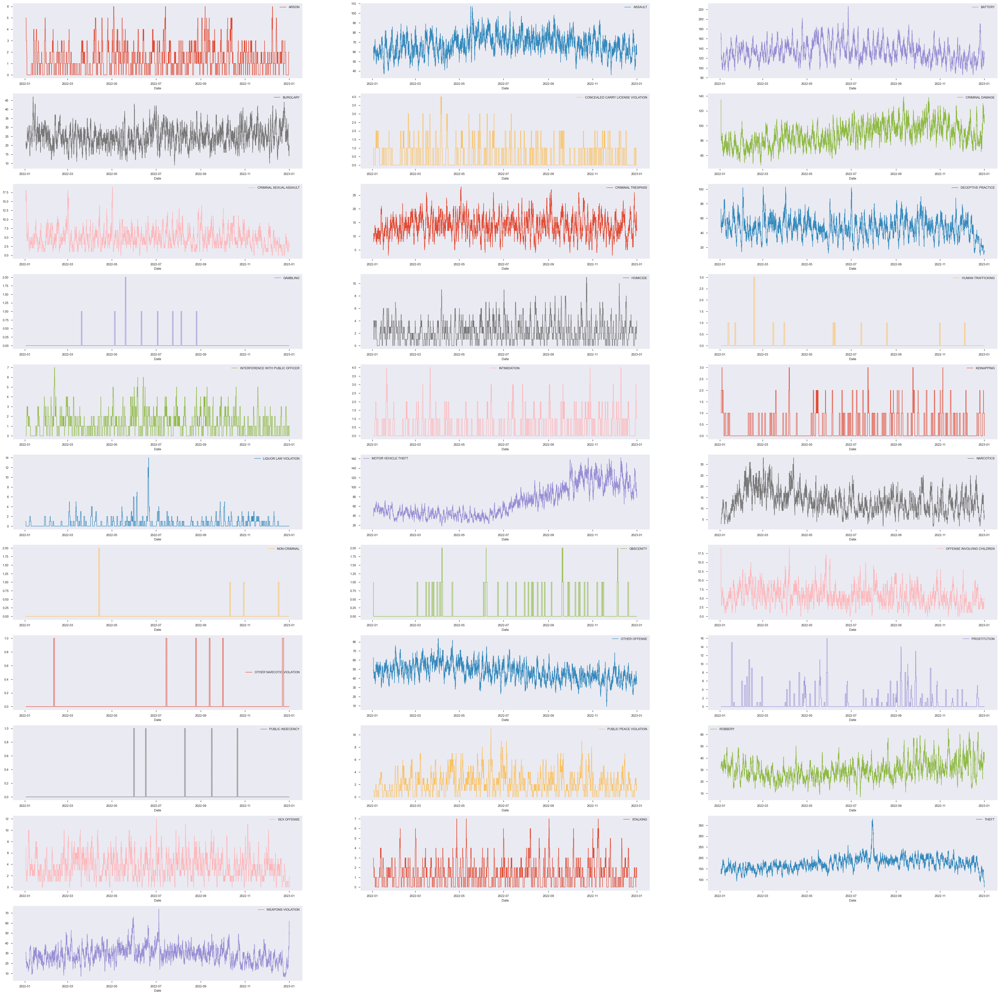

In [89]:
#Every type  of Crime vs Year
crimes_count_date = df.pivot_table('ID', aggfunc=np.size, columns='Primary Type', index='Date', fill_value=0)
crimes_count_date.index = pd.to_datetime(crimes_count_date.index)
plo = crimes_count_date.rolling(365).sum().plot(figsize=(50, 50), subplots=True, layout=(-1, 3), sharex=False, sharey=False)


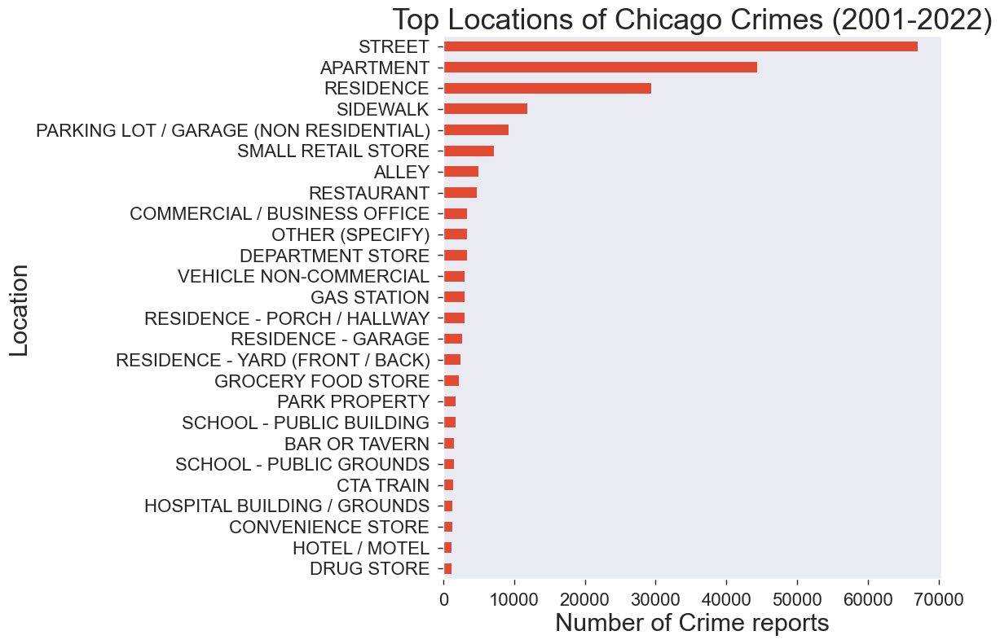

In [90]:
#Top Locations of Chicago Crimes 
location = df["Location Description"].value_counts().sort_values()
top_location = location[location>1000]

#plot
top_location.plot(kind = "barh", figsize=(12,8))
plt.title('Top Locations of Chicago Crimes (2001-2022)',fontsize = 26)
plt.xlabel('Number of Crime reports', fontsize = 22)
plt.ylabel('Location', fontsize = 22)
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.tight_layout()
plt.show()

In [91]:
map = folium.Map(location=[41.8369, -87.6847], zoom_start=10)
folium.Marker([41.8369, -87.6847]).add_to(map) 
#display(map)

In [92]:
def topfour(row):
    keep = ["THEFT", "BATTERY", "NARCOTICS", "CRIMINAL DAMAGE"]
    if row not in keep:
        return "OTHERS"
    else:
        return row

In [93]:
df["New_Type"] = df["Primary Type"].apply(topfour)


In [94]:
import folium

# Filter data for Primary Type 'NARCOTICS'
narcotics_data = df[df['Primary Type'] == 'NARCOTICS']

# Create a base map centered around Chicago
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# Create a feature group for incidents
incidents = folium.FeatureGroup(name='Incidents')

# Add markers for each incident to the feature group
for _, row in narcotics_data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Location Description']}<br>({row['Latitude']:.4f}, {row['Longitude']:.4f})",
        icon=folium.Icon(color='red')
    ).add_to(incidents)

# Add the feature group to the map
chicago_map.add_child(incidents)

# Add a layer control to switch between incident clusters
folium.LayerControl().add_to(chicago_map)

# Save the map to an HTML file
chicago_map.save('narcotics_map.html')
